In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from mpl_toolkits import mplot3d
import plotly.graph_objects as go

In [2]:
plt.rcParams["figure.figsize"] = (10,10)

# A2.1 Multiple Linear Regression

## Introduction
The goal of regression is to predict the value a continuos variable $y$ given the value of a d-dimensional vector $x$ of input variables. The Polynomial Curve Fitting is a specific example of linear regression models. The simplest form of linear regression models are also linear functions of the input variables [1].

In Activity 1.3 Multiple Linear Regression, we will implement a Multiple Linear Regression with Object Orientated Programming style.

The Study Case is structured as follows:
1. Multiple Linear Regression
2. First Try

## 1. Multiple Linear Regression Implementation

Consider a training data set comprising of $n$ observations $\{x^{(i)}\}$, where $i = 1, ..., n$ together with corresponding target values $\{y_i\}$. The goal is to predict the value of $y$ for a new value of $x$. In the simples approach, this can be done by directly constructing an appropiate function $\hat{y}(x)$ whose values for new inputs $x$ constitute the prediction for the corresponding values of $y$.

The simplest linear model for regression is one that involves a linear combination of the input variables

$$\hat{y}(x, \beta) = \beta_0 + \beta_1 x_1 + ... + \beta_d x_d $$
$$\hat{y}(x, \beta) = \sum_{i=1}^{n} \beta_i x_i $$

The key property of this model is that it is a linear function of the parameters $\beta_0$, $\beta_1$, ..., $\beta_d$. Parameters are usually grouped into a coefficient vector $\beta = (\beta_0, \beta_1, ..., \beta_d)^T$ (column vector). In this particular model, it is also a linear function of the input variables $x_i$. Nevertheless, we can exend the class of models by considering a linear combination of fixed nonlinear functions of the input variable. 

The implementation of the Multiple Linear Regression of this activity will be done by using an Object Oriented Programming style. Consider the following structure:

In [3]:
class MultipleLinearRegression:
    """
    Multiple Linear Regression fits a linear model with coefficients 
    beta = (beta_0, beta_1, ..., beta_d) to minimize the residual sum of squares 
    between the observed targets in the dataset, and the targets predicted by 
    linear regression approximation
    
    Parameters:
    * solver: String ("CSF" or "GD") which indicates what kind a method used to estimate
              the coefficents beta. "GD" by default.
              
    * lr: learning rate which is used is an hyperparamater for the Gradiend Descent solution
    
    * n_steps: Maximum number of iteration in the Gradient descent
    
    * error: error that is used along to convergencia criteria to stop the gradient descent loop
    
    
    Attributes:
    * coefficients_: Estimated coefficients for the linear regression problem.
                     It also include the incerpt at coefficients_[0].
    
    * cost: list containing the cost of each iteration inthe Gradient descent
    
    * coefficients_used_in_cost: list containing the coefficient vector used in each iteration of the Gradient Descent
    
    """
    def __init__(self, solver = "GD", lr = 0.1, n_steps = 10000, error = 1E-6):
        self.coefficients_ = []
        self.solver = solver
        self.lr = lr
        self.n_steps = n_steps
        self.error = error
        self.cost = []
        self.coefficients_used_in_cost = []
    
    def _format_x(self, X):
        """
        Private function to add a new column of values 1 to the matrix of the variables, the column is add in the beginning of the matrix
        
        Input:
        * X: Matrix or array containing the values of the input variable
        
        Output:
        * Return either a vector having added 1 to its first value or a Matrix having a new column of 1
        """
        X = np.array(X)
        #creating columns of
        new_column = [1 for i in range(len(X))] 
        
        #case of matrix
        try:
            return np.insert(X, 0, new_column, axis = 1)
        
        #case of a vector, so each value of the vector become a row
        except:
            
            X = np.reshape(X, (len(X),1))
            
            return np.insert(X, 0, new_column, axis = 1)
    
    def _fit_cfs(self, X, Y):
        """
        Function to fit a model of multiple or simple lineal regression using the closed form solution
        which is also called analytical solution
        
        Input:
        * X: Matrix or vector containing the values of the input variable
        * Y: a vector or matrix including all the values of the target variable t for a given set of point.
        
        Output:
        * return a vector of coefficients, which are minimized values for the cost formula
        
        """
        
        #adding the column of 1s
        X = self._format_x(X)
        
        Y = np.array(Y)

        #getting the transpose of X
        XT = X.transpose()
        
        #X^t x X
        XTX = np.matmul(XT, X)

        #[X^t x X]^-1
        XTX_inv = np.linalg.inv(XTX)

        #X^T x Y
        XTY = np.matmul(XT, Y)

        #[X^t x X]^-1 x X^T x Y
        XTX_inv_XTY = np.matmul(XTX_inv, XTY)
        
        #adding the values to the attributes coefficients, reshaping to get a vector instead of a matrix
        self.coefficients_ =  np.reshape(XTX_inv_XTY, (1, XTX_inv_XTY.shape[0]))[0]
        
        
    def cost_function(self, X, Y, B_values):
        """
        Function to compute the cost function given a group of coefficients
        
        Input:
        * X: Matrix or vector containing the values of the input variable
        * Y: a vector or matrix including all the values of the target variable t for a given set of point.
        * B_values: Current coeficcients
        
        Output:
        * Add to the attrobutes coefficients_used_in_cost and cost, the coeficients and the cost, respectively.
        
        """
        B_memory = np.copy(B_values)
        
        #make B into a Vector
        B_values = np.reshape(B_values, B_values.shape[0])
        
        self.coefficients_ = B_values
        
        
        n = X.shape[0]
        
        #making Y into a matrix of various rows but only 1 column
        Y = np.reshape(Y,(n,1))
        
        #saving the coefficients
        self.coefficients_used_in_cost.append(B_values)
        
        Cost_JB = np.matmul((np.matmul(X,B_memory) - Y).transpose(), (np.matmul(X,B_memory) - Y))
        
        #saving the cost for those coefficients, the [0][0] is to avoid mistakes later on but within each list within a list there is a list
        # with only one value
        self.cost.append((1/(2*n))* Cost_JB[0][0])
    
    
        
    def _fit_gd(self, X, Y):
        """
        Function to fit a model using gradient descent
        
        Input:
        * X: Matrix or vector containing the values of the input variable
        * Y: a vector or matrix including all the values of the target variable t for a given set of point.
        
        Output:
        * Assign the most minimazed coeffients to the attribute coefficients_
        
        """
    
        X = self._format_x(X)

        X_n = X.shape[1]

        X_rows = X.shape[0]

        Y = np.array(Y)

        #producing the initial vector of coefficients of only 1s
        B =  np.ones((X_n,1))
        
        #function to save i-1 coefficients
        B_memory =  np.copy(B)
        
        #reseting attribute cost
        self.cost = []
        

        #loop for the maximum number of iterations
        for iteration in range(self.n_steps):
            
            #analytical solution to the summations
            XB_Y = np.matmul(X,B) - Y
                        
            
            derivada_JB = (1/X_rows) * np.matmul(X.transpose(), XB_Y)
            

            B = B - self.lr * (derivada_JB)
                
            #getting the cost values
            self.cost_function(X, Y, B)
            
            #checking the convergence criteria for stoping the loop
            if self._convergence_criteria(B, B_memory):
                B_memory = np.copy(B)
            else:
                break

        self.coefficients_ = np.reshape(B, B.shape[0])
    
        
    def _convergence_criteria(self, B_new, B_old):
        """
        Function to check the convergence criteria and whether to stop the loop or not
        
        Input:
        * B_new: current coefficients
        * B_old: coefficients just one loop before to the B_new
        
        Output:
        * Boolean to stop the loop or not
        """
        
        B_subs = B_new - B_old     

        B_subs_squared = np.power(B_subs,2)  

        B_subs_squared_sum = sum(B_subs_squared)

        if np.sqrt(B_subs_squared_sum) < self.error:
            return False
        else:
            return True
    
    def predict(self, X):
        """
        Function to predict the values of the model
        
        Input:
        *X: a vector including all the values of the input variable x for a given set of point.
        *self.coefficients_: coefficient vector.
        
        Output:
        Matrix of y-axis points predicted from the x-values, they are in order so the x in index 1 its prediction is also in index one
        of the obtained list. And is a matrix so it is it has the same number of rows as x-value but only once column
        
        The matrix Y it has the same number of rows as X, but just one column 
        """
        X = np.array(X)
        
        X = self._format_x(X)
    
        X_len = X.shape[0]
        
        prediction = np.sum(X * self.coefficients_, axis = 1)
        
        return np.reshape(prediction, (len(prediction),1))
        
    
    
    def fit(self, X, Y):
        """
        Function to fit the model according to the solver given, either gradient descent or Closed Form Solution
        
        Input:
        * X: Matrix or vector containing the values of the input variable
        * Y: a vector or matrix including all the values of the target variable t for a given set of point.
        
        Output:
        * model fitted according to the solver given
        
        """
        if self.solver == "GD":
            self._fit_gd(X,Y)
        
        elif self.solver == "CSF":
            self._fit_cfs(X,Y)
        
        else:
            raise Solver("That solver does not exist")
            
    def RMSE(self, Y, Y_predicted):
        """
        Docstring

        Input:
        y: a vector including all the predicted values of the target variable for a given set of point.
        t: a vector including all the values of the target variable t for a given set of point.

        Output:
        The root.mean square error
        """
        N = Y.shape[0]
        return np.sqrt(sum(np.power(Y_predicted - Y, 2))/N)[0]
            
        

Complete the following task by implementing the functions. In all cases, use the vectorized expressions given during the lecture. You can create "private" methods and attributes.

**T1.** Complete the function `MultipleLinearRegression._format_x(self, X)`.  The function should add a columns of 1's to $X$. The original shape of $X$ shold be n (number of instances) $\times$ d (number of input variables). The function should return an array of $n \times (d + 1)$ dimensions.

**T2.** Complete the function `MultipleLinearRegression.predict(self, X)`.  The function should return $\hat{y}$ based on the observations of the input variable array $X$ and the vector coefficients $\beta$. 

**T3.** Complete the function `MultipleLinearRegression._fit_cfs(self, X, Y)`.  The function should fit the model to the data $X$, $Y$. It should use `MultipleLinearRegression._format_x(self, X)` to give the appropiate format to X. The function should estimate the best values of $\beta$ by using the Closed Form Solution.

**T4.** Complete the function `MultipleLinearRegression._fit_gd(self, X, Y)`.  The function should fit the model to the data $X$, $Y$. It should use `MultipleLinearRegression._format_x(self, X)` to give the appropiate format to X. The function should estimate the best values of $\beta$ by using Gradient Descent. It must stop after the completion of a given number of steps `n_steps` or the following convergence criteria:

$||\beta_{new} - \beta_{old}||_2 < error$

where `error` if an attribute of the model.

**T5.** Complete the function `MultipleLinearRegression.fit(self, X, Y)`. The function should fit the model to the data $X$, $Y$ according to the selected `solver`, i.e. by using the implemented function in **T3** or **T4**. Additionally, document `MultipleLinearRegression`.


## 2. First Try

Consider the simulated data `x`and `y` given in the following cell. We will explore the properties of the linear regression model. Here you must fit the data by using a linear model with a single input variable:

$$ \hat{y} = \beta_0 + \beta_1 x$$

In order to complete the following tasks, you can modify `MultipleLinearRegression` according to your needs. Split the data into a training and test set. Complete tasks **T6** to **T10** with the training set.  

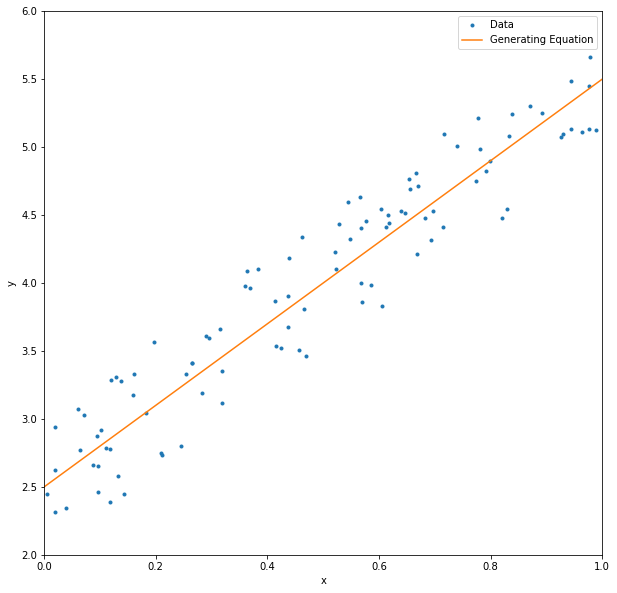

In [4]:
np.random.seed(0)
x = np.random.rand(100, 1)
y = 2 + 3*x + np.random.rand(100,1)
xline = np.linspace(0, 1, 100) 
yline = 2.5 + 3*xline

fig, ax = plt.subplots()
ax.plot(x, y, '.', label = "Data")
ax.plot(xline, yline, '-', label = "Generating Equation") 
ax.set(xlabel = 'x', ylabel = 'y')
ax.set_xlim([0,1])
ax.set_ylim([2, 6])
ax.legend()
plt.show()

**T6.** Create a 3D plot of the cost function $J(\beta, X)$ as a function of $\beta_0$ and $\beta_1$.

##### Disclaimer: 
If you do not like the following in the next link : https://drive.google.com/file/d/1EvNCB4BOwujH6azm4J2E_G716M28Du-m/view?usp=sharing, you may find graphs that you like.
It is also a notebook we did, but we did not comment xd

In [5]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = .20)

In [6]:
model_gd_for_3D = MultipleLinearRegression("GD", lr = .1)

model_gd_for_3D.fit(x_train,y_train)

model_gd_for_3D.coefficients_

array([2.59274176, 2.90417945])

In [7]:
x_axis_3d = np.array(model_gd_for_3D.coefficients_used_in_cost)[0:, 0]
y_axis_3d = np.array(model_gd_for_3D.coefficients_used_in_cost)[0:, 1]
z_axis_3d = model_gd_for_3D.cost

In [8]:
from mpl_toolkits.mplot3d import Axes3D

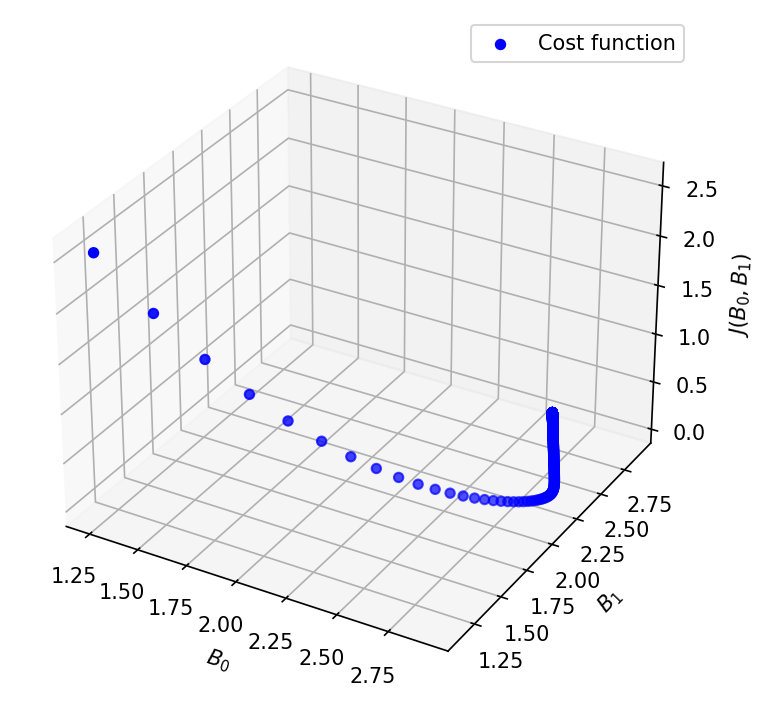

In [9]:
plt.figure(figsize=(10, 6), dpi=150) 
ax = plt.axes(projection='3d') 
ax.scatter(x_axis_3d, y_axis_3d, z_axis_3d, s=20, color="blue", label="Cost function")
ax.set(xlabel= "$B_{0}$", ylabel = "$B_{1}$",zlabel = "$J(B_{0}, B_{1})$")
plt.legend()
plt.show()

#### Surface Plot

###### NOTE:
Change the lr to a bigger or equal number to .3, do it with .1 or less if you have a good RAM memory Because it will iterate more than 1000000 

In [10]:
model_gd_for_3D = MultipleLinearRegression("GD", lr = .3)

model_gd_for_3D.fit(x_train,y_train)

model_gd_for_3D.coefficients_

array([2.59270088, 2.90425987])

In [11]:
#Getting the values for each axis
x_axis_3d = np.array(model_gd_for_3D.coefficients_used_in_cost)[0:, 0]
y_axis_3d = np.array(model_gd_for_3D.coefficients_used_in_cost)[0:, 1]
z_axis_3d = model_gd_for_3D.cost

In [12]:
#getting the lisf of all B0 combinates with each B1
list_thetas = np.array([np.array([theta_0, theta_1]) for theta_0 in x_axis_3d for theta_1 in y_axis_3d])
#reshaping X and Y
n = len(y_train)
Y = np.reshape(y_train,(n,1))
X = model_gd_for_3D._format_x(x_train)

In [13]:
#list to save the cost of each B0, B1
coefficients_used_in_cost = []

Costos = []

#Loop to go through each combination of B0 B1
for thetas in list_thetas:
    Y = np.reshape(Y,(n,1))
        
    #saving the coefficients
    coefficients_used_in_cost.append(thetas)
    
    #Computing the cost using the vectorizacion form
    Cost_JB = np.matmul((np.matmul(X,thetas) - Y).transpose(), (np.matmul(X,thetas) - Y))
    
    Costos.append((1/(2*n))* Cost_JB[0][0])

In [14]:
#reshaping matrix
cost_matrix = np.array(Costos).reshape(len(x_axis_3d), len(x_axis_3d)) 
coefficients_used_in_cost = np.array(coefficients_used_in_cost)

###### Disclaimer:

We don't know but in plotly the x-axis is in the right and the y-axis in the left, and in matplot x-axis is in the left and y-axis in the right, that is because the graph differs in the name of axis

In [15]:
fig = go.Figure(data = go.Surface(z = cost_matrix, x = x_axis_3d, y = y_axis_3d))

fig.update_layout(title='Cost Function',
                  scene=dict(
                    xaxis = dict(range=[min(x_axis_3d),max(x_axis_3d)]),
                    yaxis = dict(range=[min(y_axis_3d),max(y_axis_3d)]),
                    xaxis_title='B0',
                    yaxis_title='B1',
                    zaxis_title='J(B0,B1)'),
                  width=700, height=700)

fig.show()

**T7.** Obtain $\beta^\star$ which minimize the cost function $J(\beta, X)$ by using the Closed Form Solution and Gradient Descent.

##### Closed Form Solution

In [16]:
model_csf = MultipleLinearRegression("CSF")

model_csf.fit(x_train,y_train)

model_csf.coefficients_

array([2.59268098, 2.90429901])

##### Gradient Descent

In [17]:
model_gd = MultipleLinearRegression("GD")

model_gd.fit(x_train,y_train)

model_gd.coefficients_

array([2.59274176, 2.90417945])

**T8.** Make a plot in order to show the values of the $J(\beta, X)$ in function of the number of steps. Make a comparison by including different values of the Learning Rate $\lambda$.

In [18]:
lambdas = [round(i*.1,1) for i in range (1,9)]
colors = ['blue', 'orange', 'green', 'red' , 'purple', 'brown', 'cyan', 'black']

## Sharing X and Y axis

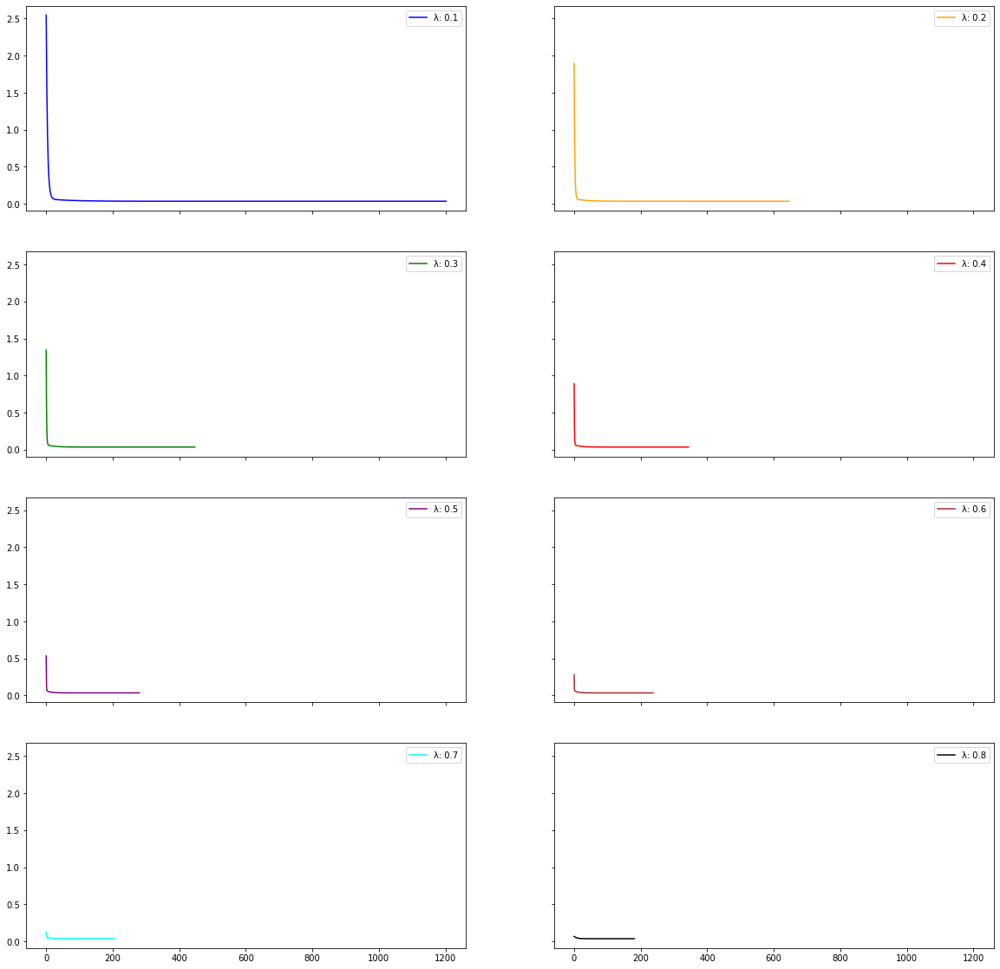

In [19]:
fig, ax = plt.subplots(4,2, sharex = True, sharey = True)

fig.set_figheight(20)
fig.set_figwidth(20)

y_axis = []

x_axis = []

control_x = 0

control_y = 0

for lambda_i in lambdas:
    model_GD = MultipleLinearRegression("GD", lr = lambda_i)
    model_GD.fit(x_train,y_train)
    n_steps_used = len(model_GD.cost)
    x_axis.append([j for j in range(n_steps_used)])
    y_axis.append(model_GD.cost)

for i in range(8):
        ax[control_x, control_y].plot(x_axis[i], y_axis[i], label = "λ: " + str(lambdas[i]), color = colors[i])
        ax[control_x, control_y].legend()
        
        if control_y == 0:
            control_y += 1
        else:
            control_y = 0
            control_x += 1
        
        
        
plt.show()     

### Not sharing axis

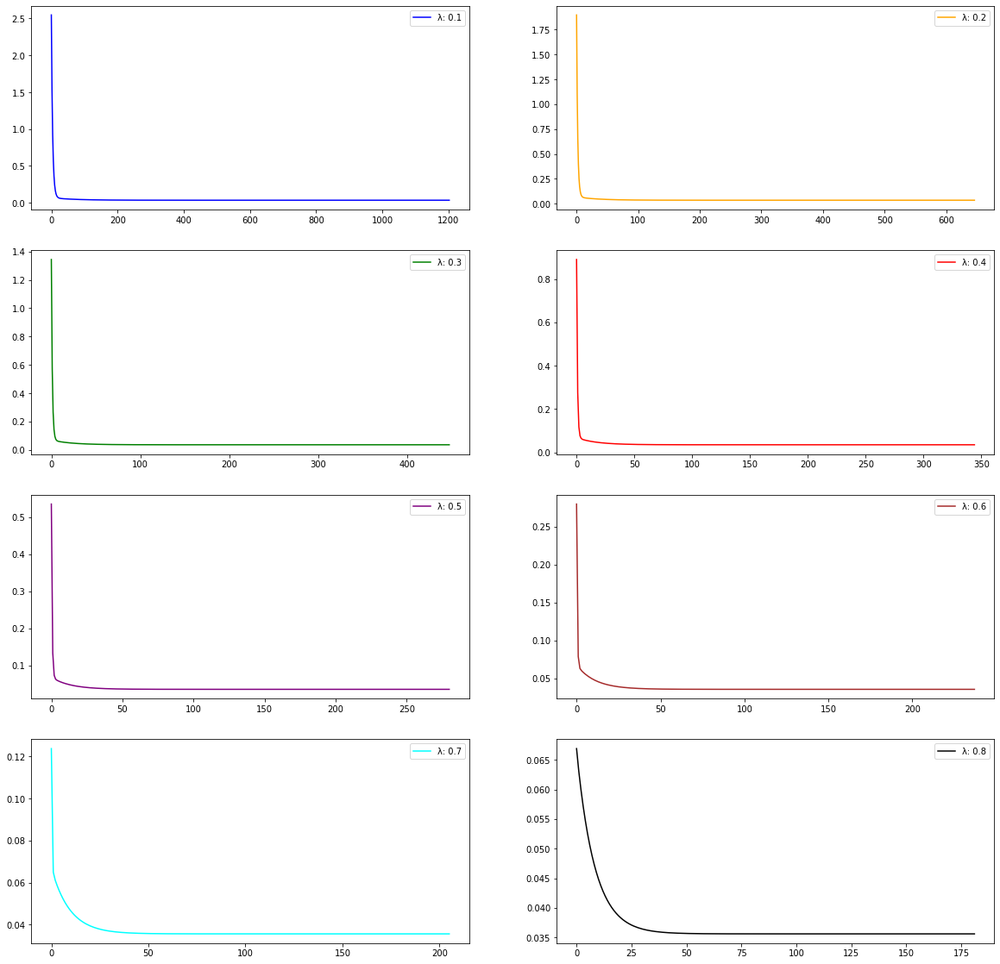

In [20]:
fig, ax = plt.subplots(4,2)

fig.set_figheight(20)
fig.set_figwidth(20)

y_axis = []

x_axis = []

control_x = 0

control_y = 0

for lambda_i in lambdas:
    model_GD = MultipleLinearRegression("GD", lr = lambda_i)
    model_GD.fit(x_train,y_train)
    n_steps_used = len(model_GD.cost)
    x_axis.append([j for j in range(n_steps_used)])
    y_axis.append(model_GD.cost)

for i in range(8):
        ax[control_x, control_y].plot(x_axis[i], y_axis[i], label = "λ: " + str(lambdas[i]), color = colors[i])
        ax[control_x, control_y].legend()
        
        if control_y == 0:
            control_y += 1
        else:
            control_y = 0
            control_x += 1

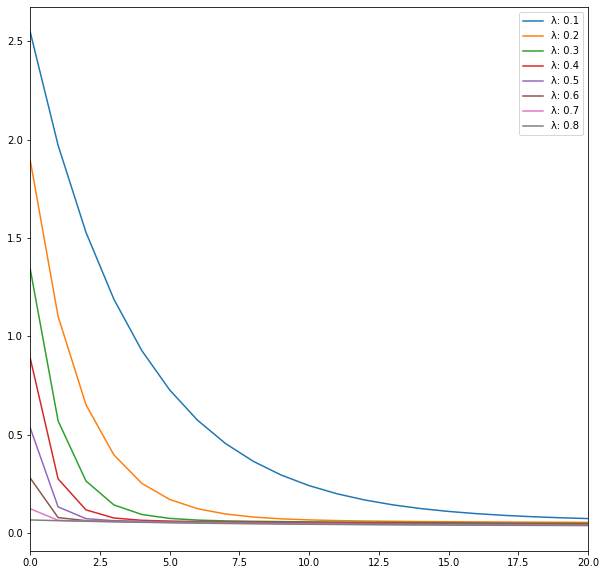

In [21]:
y_axis = []

x_axis = []

plt.figure(figsize=(10, 10))

for lambda_i in lambdas:
    model_GD = MultipleLinearRegression("GD", lr = lambda_i)
    model_GD.fit(x_train,y_train)
    n_steps_used = len(model_GD.cost)
    x_axis = [j for j in range(n_steps_used)]
    plt.plot(x_axis, model_GD.cost, label = "λ: "+str(lambda_i))
    
plt.legend()
plt.xlim([0,20])
plt.show()

#### Using log scale

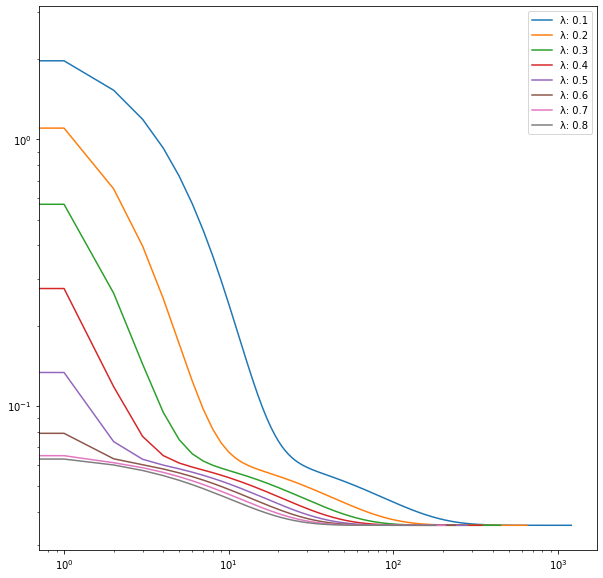

In [22]:
y_axis = []

x_axis = []

plt.figure(figsize=(10, 10))

for lambda_i in lambdas:
    model_GD = MultipleLinearRegression("GD", lr = lambda_i)
    model_GD.fit(x_train,y_train)
    n_steps_used = len(model_GD.cost)
    x_axis = [j for j in range(n_steps_used)]
    plt.plot(x_axis, model_GD.cost, label = "λ: "+str(lambda_i))
    
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.show()

**T9.** Create a plot comparing the Data, the Analytical Solution and the Generating Function.

In [23]:
model_csf = MultipleLinearRegression("CSF")

model_csf.fit(x_train,y_train)

model_csf.coefficients_

array([2.59268098, 2.90429901])

In [24]:
x_axis = np.linspace(0,1,100)

In [25]:
y_predicted_csf = model_csf.predict(x_axis)

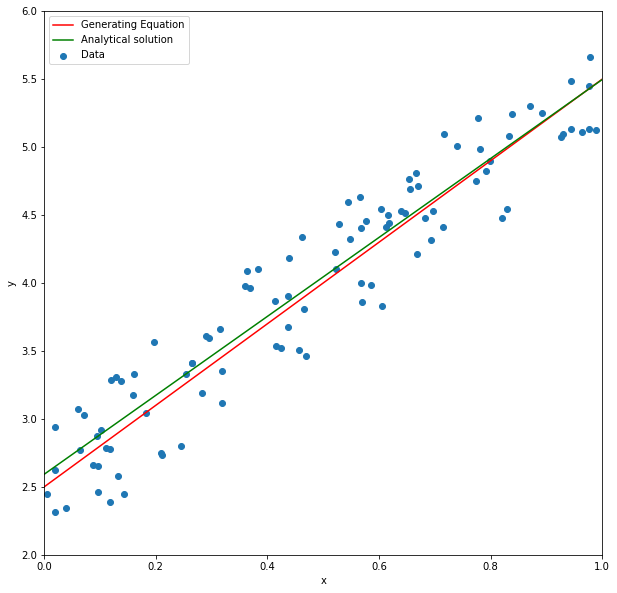

In [26]:
fig, ax = plt.subplots()
ax.scatter(x, y, label = "Data")
ax.plot(xline, yline, '-', label = "Generating Equation", color = 'red') 
ax.plot(x_axis, y_predicted_csf, label = "Analytical solution", color = 'green')
ax.set(xlabel = 'x', ylabel = 'y')
ax.set_xlim([0,1])
ax.set_ylim([2, 6])
ax.legend()
plt.show()

**T10.** Create a plot comparing the Data, the Gradient Descent Solution and the Generating Function.

In [27]:
model_gd = MultipleLinearRegression("GD")

model_gd.fit(x_train,y_train)

model_gd.coefficients_

array([2.59274176, 2.90417945])

In [28]:
y_predicted_gd = model_gd.predict(x_axis)

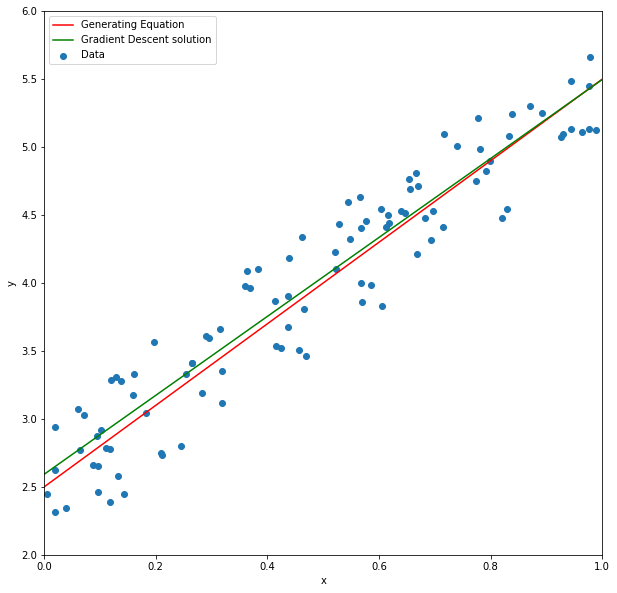

In [29]:
fig, ax = plt.subplots()
ax.scatter(x, y, label = "Data")
ax.plot(xline, yline, '-', label = "Generating Equation", color = 'red') 
ax.plot(x_axis, y_predicted_gd, label = "Gradient Descent solution", color = 'green')
ax.set(xlabel = 'x', ylabel = 'y')
ax.set_xlim([0,1])
ax.set_ylim([2, 6])
ax.legend()
plt.show()

**T11.** Estimate the performance of the model by computing the root-mean-squared error of the test set.

In [30]:
predicted_csf_test = model_csf.predict(x_test)
predicted_gd_test = model_gd.predict(x_test)

##### Closed form solution

In [31]:
model_csf.RMSE(y_test, predicted_csf_test)

0.31404613105735346

##### Gradient descent

In [32]:
model_gd.RMSE(y_test, predicted_gd_test)

0.31405254422834655

**T12.** Make the prediction of the following values of x.


| x |
|-----------|
| 0.11      |
| 0.23      |
| 0.47      |
| 0.65      |
| 0.84      |

In [33]:
x_to_be_predicted = [.11, .23, .47, .65, .84]

##### Closed Form solution

In [34]:
model_csf.predict(x_to_be_predicted)

array([[2.91215387],
       [3.26066975],
       [3.95770151],
       [4.48047534],
       [5.03229215]])

##### Gradient descent

In [35]:
model_gd.predict(x_to_be_predicted)

array([[2.9122015 ],
       [3.26070303],
       [3.9577061 ],
       [4.4804584 ],
       [5.03225249]])

Now, consider the simulated data `x`and `y` given in the following cell. In the given data, you have two input variables.

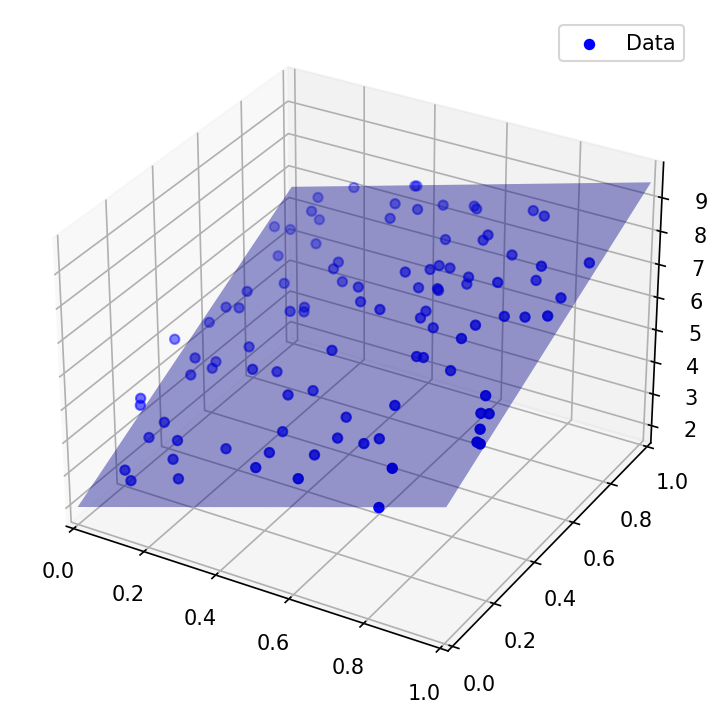

In [36]:
np.random.seed(0)
x1 = np.random.rand(100, 1)
x2 = np.random.rand(100, 1)
y = 2 + 3*x1 + 4*x2 + np.random.rand(100, 1)

plt.figure(figsize=(10, 6), dpi=150) 
ax = plt.axes(projection='3d') 
plt.ylim(0, 1)
plt.xlim(0, 1)
ax.scatter(x1, x2, y, s=20, color="blue", label="Data")
ax.plot_surface(np.array([[0,1],[0, 1]]), np.array([[0, 0], [1, 1]]), np.array([[2, 5.5],[6.5, 9.5]]), color='darkblue', alpha=.4)
plt.legend()
plt.show()

**T13.** Fit the linear model to the data and present the values. Print $\beta^\star$ obtained by the Closed Form Solution and the Gradient Descent Technique.

In [37]:
x_joint = np.concatenate((x1,x2), axis = 1)

##### Closed Form Solution

In [38]:
model_cfs = MultipleLinearRegression("CSF")

model_cfs.fit(x_joint,y)

print("B*: ", model_cfs.coefficients_)

B*:  [2.60497806 2.95300697 3.86152133]


##### Gradient Descent

In [39]:
model_gd = MultipleLinearRegression("GD")

model_gd.fit(x_joint,y)

print("B*: ", model_gd.coefficients_)

B*:  [2.60509994 2.95290667 3.86139152]


## References

[1] C. M. Bishop (2006). Pattern Recognition and Machine Learning. 

## Grading Scheme

| Task | Value  |
|------|--------|
| Section 1   | 50 pts |
| Section 2   | 50 pts |
